# CarnND Advance Lanes 
Author: Igor Passchier

## Compute the camera calibration matrix and distortion coefficients
In this first step, the camera calibration matrix and distortion coefficient are calculated


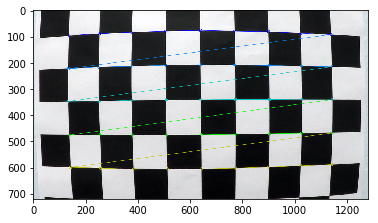

In [1]:
%matplotlib inline

# import the libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

#first, go through the whole process once, to see the steps. Then, we will do all images
# Number of checker bord corners in x and y
nx = 9
ny = 5

# Read 1 image
fname = 'camera_cal/calibration1.jpg'
img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, imgpoints = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), imgpoints, ret)
    plt.imshow(img)
else:
    print ('No checkerbord found. Wrong number of points?')

In [2]:
# Calculate distortion matrix, based on all images

images = glob.glob('camera_cal/calibration*.jpg')
objectPoints=[]
imagePoints=[]

nx=9
ny=6
objs=np.zeros([nx*ny,3],np.float32)
objs[:,:2]=np.mgrid[0:nx,0:ny].T.reshape(-1,2)

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objectPoints.append(objs)
        imagePoints.append(corners)

    else:
        print ('No checkerbord found in '+fname)

        
#perform the calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objectPoints, imagePoints, gray.shape, None, None)
###GLOBAL VARIABLES

No checkerbord found in camera_cal/calibration1.jpg
No checkerbord found in camera_cal/calibration4.jpg
No checkerbord found in camera_cal/calibration5.jpg


## Helper functions for plotting

In [3]:
#Plot 2 images next to each other
def plot2(img1,img2,title1=None,title2=None,grey1=False,grey2=False):
    f, ax = plt.subplots(1,2, figsize=(20, 10))
    if (grey1):
        ax[0].imshow(img1,cmap='gray')
    else:
        ax[0].imshow(img1)
    if (title1 != None):
        ax[0].set_title(title1)
    if (grey2):
        ax[1].imshow(img2,cmap='gray')
    else:
        ax[1].imshow(img2)

    if (title2 != None):
        ax[1].set_title(title2)
    plt.show()
    

## Apply a distortion correction to raw images.

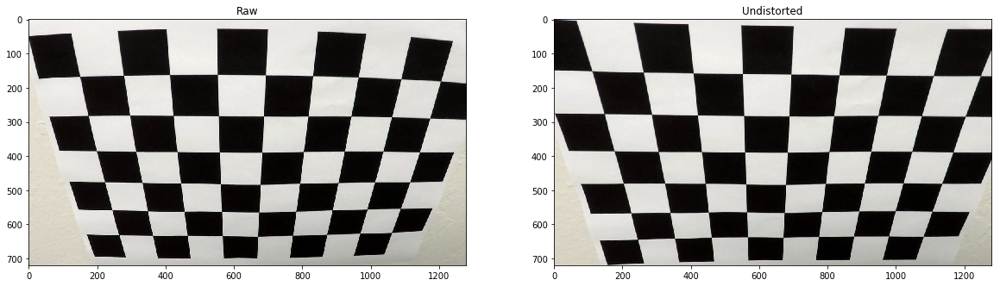

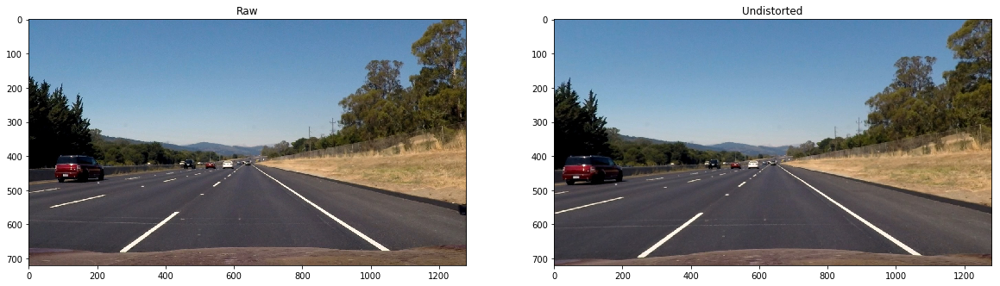

In [4]:
def undistorted_sample(fname):
    f, ax = plt.subplots(1,2, figsize=(20, 10))
    ax[0].imshow(img)
    ax[0].set_title('Original')
    ax[1].imshow(dst)
    ax[1].set_title('Undistorted')
    plt.show()
    

        
    
# Read 1 image
#undistorted_sample('camera_cal/calibration2.jpg')
#undistorted_sample('test_images/straight_lines2.jpg')

#read an image, convert to RGB, and undistort
def read_image(fname):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)



raw=read_image('camera_cal/calibration2.jpg')
img=undistort(raw)
plot2(raw,img,'Raw','Undistorted')

raw=read_image('test_images/straight_lines2.jpg')
img=undistort(raw)
plot2(raw,img,'Raw','Undistorted')
    

In [5]:
#Read all test images for later use. They are stored by name in test_images

from os.path import basename,splitext

img_names = glob.glob('test_images/*')
###GLOBAL VARIABLE
test_images={}
for fname in img_names:
    img=undistort(read_image(fname))
    name=splitext(basename(fname))[0]
    test_images[name]=img

print("{} test images read from file".format(len(test_images.keys())))

9 test images read from file


## Create a threshold binary image

The final function to create the binary image with all the (possible) lane pixels, is <code>filter(img)</code>


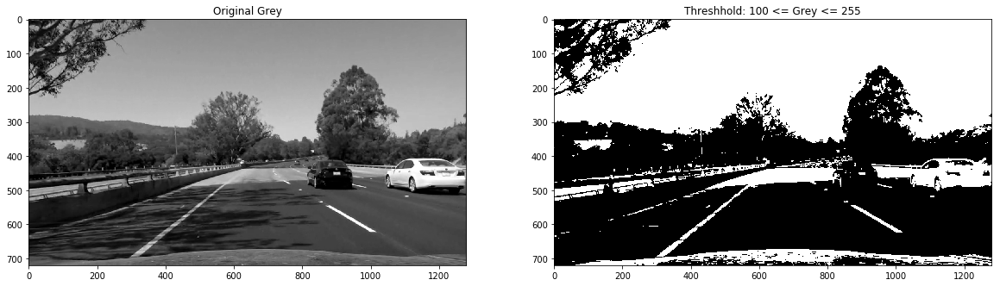

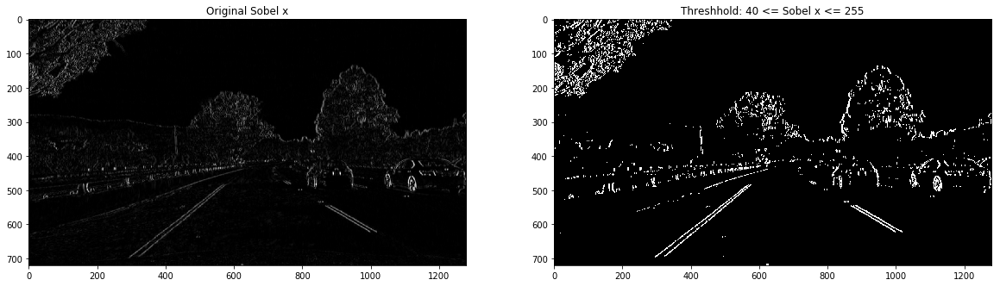

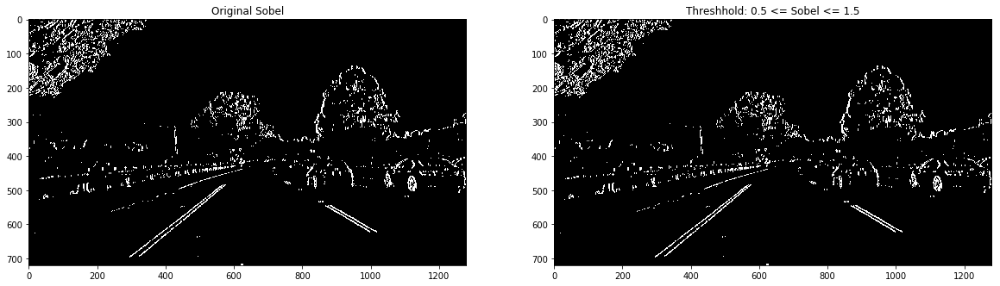

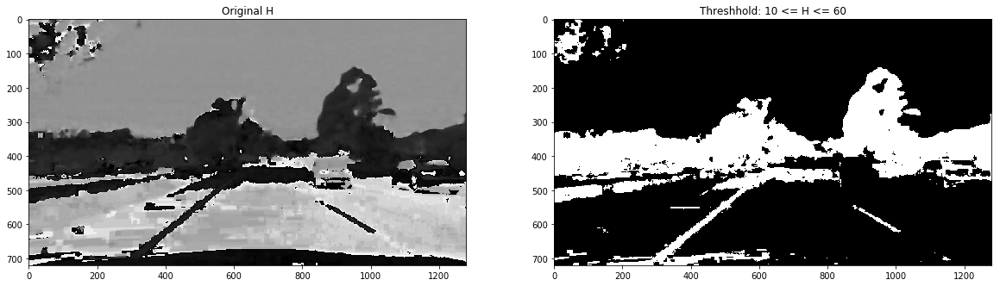

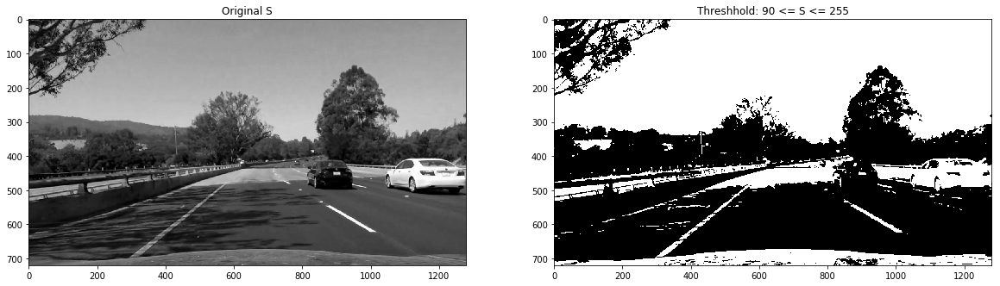

...

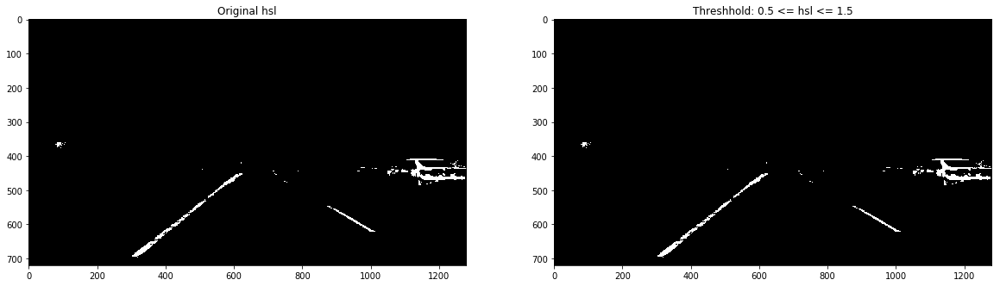

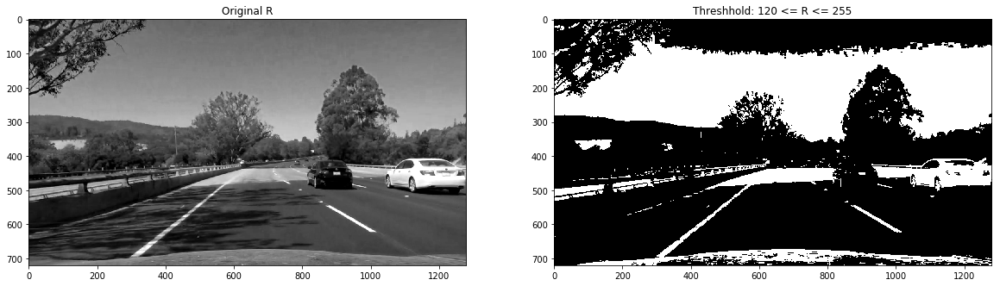

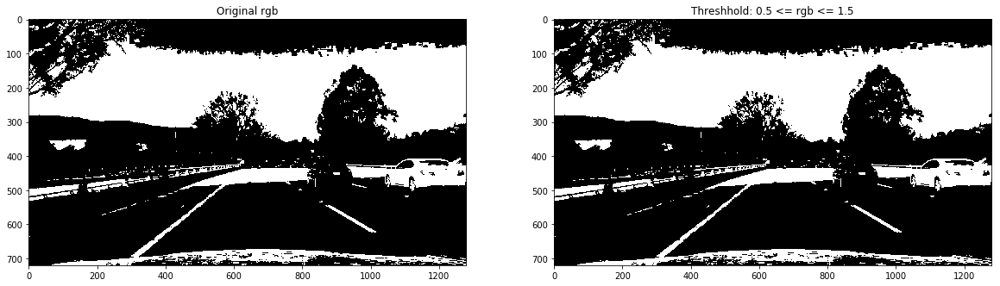

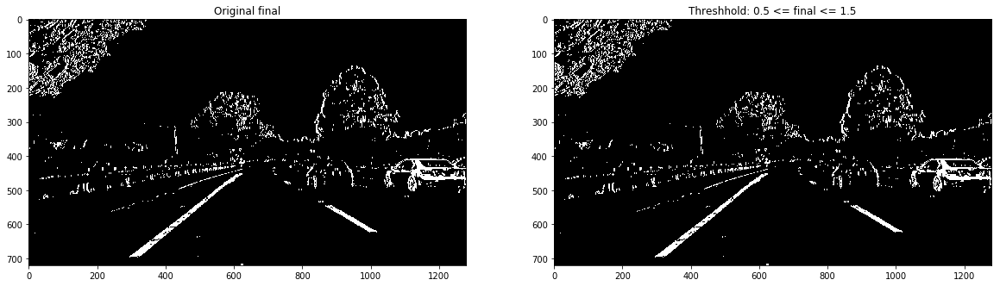

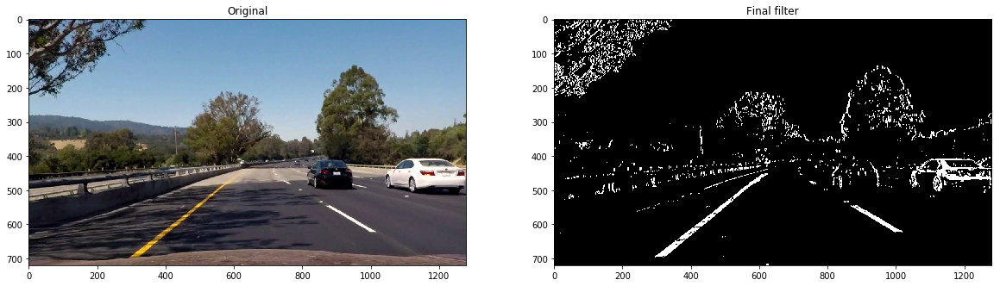

In [39]:
#Helper function to threshold range to greyscale image. If a name is given,
#then the original and filtered images are also plotted
def apply_threshold(img,tmin,tmax,name=None,plot=False):
    res=np.zeros_like(img)
    res[(img>=tmin)&(img<=tmax)]=1
    if (plot):
        f, ax = plt.subplots(1,2, figsize=(20, 10))
        ax[0].imshow(img,cmap='gray')
        ax[0].set_title('Original '+name)
        ax[1].imshow(res,cmap='gray')
        ax[1].set_title('Threshhold: {} <= {} <= {}'.format(tmin,name, tmax))
        plt.show() 
    return res

# Function to calculate sobel values. Depending on the value of orient, sobelx, sobely, gradient or absolute value
# is provided
def sobel(grey,orient='abs',ksize=3):
    sobelx = cv2.Sobel(grey, cv2.CV_64F, 1, 0,ksize=ksize)
##    sobely = cv2.Sobel(grey, cv2.CV_64F, 0, 1,ksize=ksize)
##    sobel= np.sqrt(np.square(sobelx)+np.square(sobely))
##    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
##    sobel=np.uint8(255*sobel/np.max(sobel))
    sobelx=np.uint8(255*np.abs(sobelx)/np.max(sobelx))
##    sobely=np.uint8(255*np.abs(sobely)/np.max(sobely))
##    absgraddir=np.uint8(255*2*absgraddir/np.pi)
    
    if (orient=='x'):
        return sobelx
    if (orient=='y'):
        return sobely
    if (orient=='grad'):
        return absgraddir
    if (orient=='abs'):
        return sobel
    return sobel

#overall function to filter for lanemarker pixels
#return an binary image of the same size
def filter(img,plot=False,debug=False):
    #Grey threshold
    grey = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    greybin = apply_threshold(grey,100,255,'Grey',plot)

    #Sobel threshold
    sx=sobel(grey,'x',7)
    sxbin=apply_threshold(sx,40,255,'Sobel x',debug)
##    sy=sobel(grey,'y',7)
##    sybin=apply_threshold(sy,70,255,'Sobel y',debug)
##    sa=sobel(grey,'abs',7)
##    sabin=apply_threshold(sa,40,170,'Sobel',debug)
##    sgrad=sobel(grey,'grad',9)
##    sgradbin=apply_threshold(sgrad,130,170,'Direction',debug)
    sobelbin=sxbin
    apply_threshold(sobelbin,0.5,1.5,'Sobel',plot)


    #HSL threshold
    hsl=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    h=apply_threshold(hsl[:,:,0],10,60,'H',debug)
    s=apply_threshold(hsl[:,:,1],90,255,'S',debug)
    l=apply_threshold(hsl[:,:,2],90,255,'L',debug)
    hslbin=np.zeros_like(h)
    hslbin[(h>0) & (s>0) & (l>0)]=1
    apply_threshold(hslbin,0.5,1.5,'hsl',plot)

    #RGB Trheshold
    r=apply_threshold(img[:,:,0],120,255,'R',debug)
##    g=apply_threshold(img[:,:,1],120,255,'G',debug)
##    b=apply_threshold(img[:,:,2],120,255,'B',debug)
    rgbbin=r
    apply_threshold(rgbbin,0.5,1.5,'rgb',plot)


    linbin=np.zeros_like(rgbbin)
    linbin[((greybin>0) & (rgbbin>0) & (hslbin>0)) | (sobelbin>0)]=1
    apply_threshold(linbin,0.5,1.5,'final',plot)
    return linbin

#Read the test image
img = test_images['extra1']
bin=filter(img,True,True)
plot2(img,bin,'Original','Final filter',False,True)


## Birds-eye view

The final function to perform the calculation is <code>calculate_perspective_warp()</code>. This function
returns <code>M</code> and <code>Minv</code>. These can be used in <code>warp(img,M)</code> to perform the actual
warp or inverse warp.


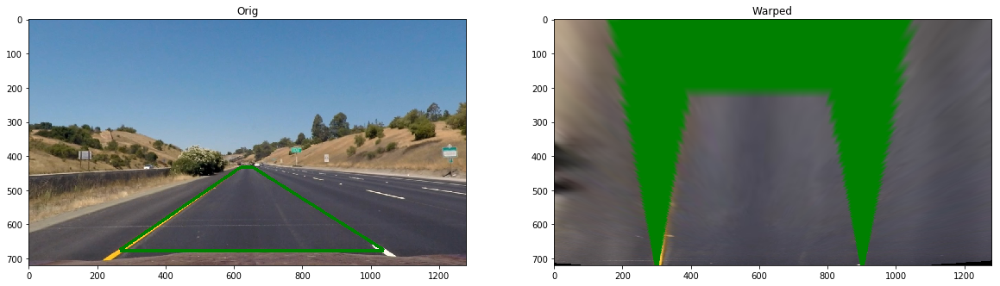

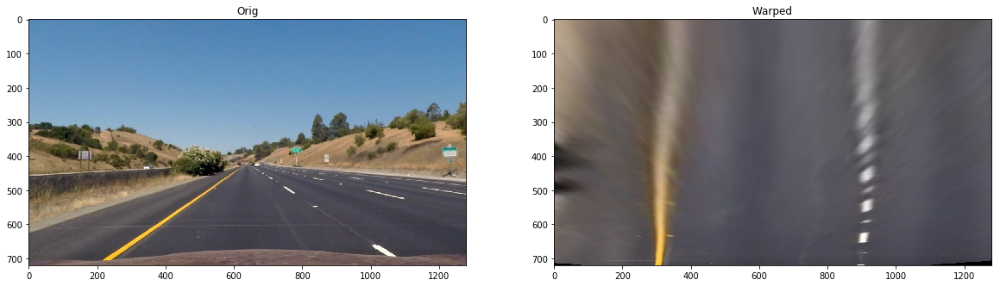

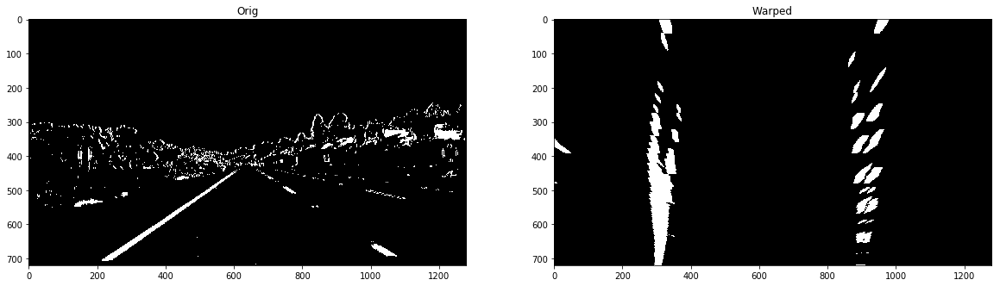

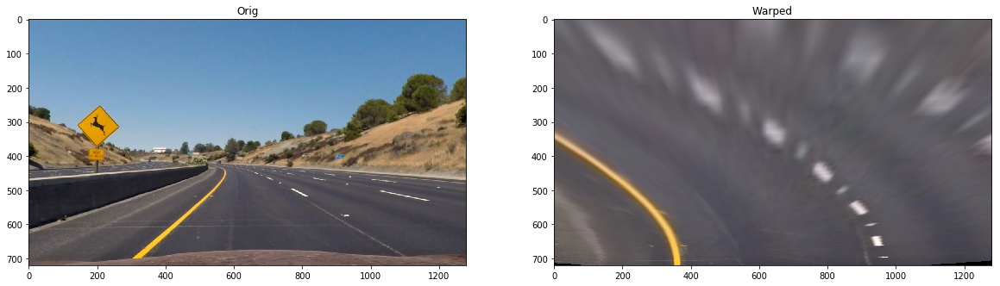

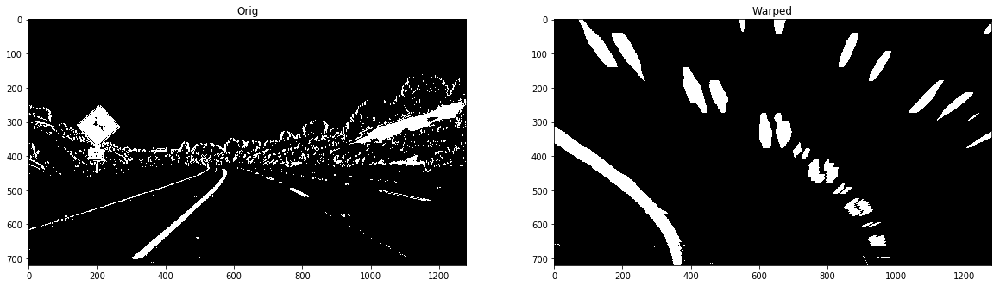

In [7]:
from PIL import Image, ImageDraw

def calculate_perspective_warp(target_left=300,target_right=900):
    img=test_images['straight_lines1']
    #src and destination points
    #dst choosen to put the lines at x=300 and x=980

    src=np.array([[266,675],[1038,675],[655,433],[619,433],[266,675]],np.float32)
    dst=np.array([[target_left,719],[target_right,719],[target_right,10],[target_left,10],[target_right,719]],np.float32)
    M = cv2.getPerspectiveTransform(src[0:4], dst[0:4])
    Minv = cv2.getPerspectiveTransform(dst[0:4], src[0:4])
    
    
    shape=(img.shape[1],img.shape[0])
    warped = cv2.warpPerspective(img, M, shape, flags=cv2.INTER_LINEAR)
    #binw=cv2.warpPerspective(bin, M, shape, flags=cv2.INTER_LINEAR)

    pic = Image.fromarray(img)
    draw=ImageDraw.Draw(pic)
    draw.line(src,fill='green',width=10)
    orig=np.array(pic.getdata(),
                    np.uint8).reshape(pic.size[1], pic.size[0], 3)
    warped = cv2.warpPerspective(orig, M, shape, flags=cv2.INTER_LINEAR)
    plot2(orig,warped,'Orig','Warped')
    
    
    return M,Minv

(M,Minv)=calculate_perspective_warp()


def warp(img,M,plot=False):
    shape=(img.shape[1],img.shape[0])
    warped = cv2.warpPerspective(img, M, shape, flags=cv2.INTER_LINEAR)
    if (plot):
           plot2(img,warped,'Orig','Warped',True,True)
 
    return warped

warped=warp(test_images['straight_lines1'],M,True)
warped=warp(filter(test_images['straight_lines1']),M,True)
warped=warp(test_images['test2'],M,True)
warped=warp(filter(test_images['test2']),M,True)




## Detect lane pixels and fit to find the lane boundary


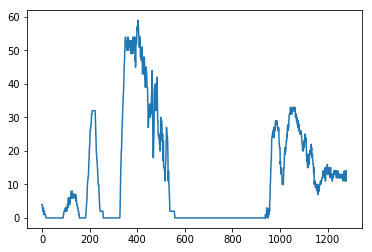

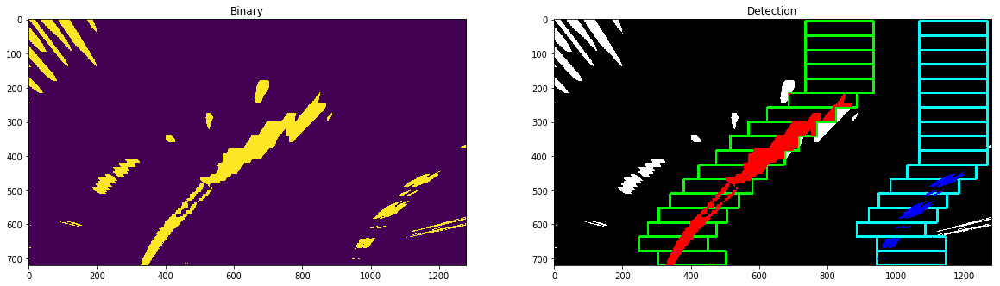

In [8]:
def calculate_windows(shape,xlcenter,xrcenter,margin):
    xllow = max(min(xlcenter - margin,shape[1]),0)
    xrlow = max(min(xrcenter - margin,shape[1]),0)
    xlhigh = max(min(xlcenter + margin,shape[1]),0)
    xrhigh = max(min(xrcenter + margin,shape[1]),0)
    return xllow,xrlow,xlhigh,xrhigh

def calc_fit(fit,y):
    x = (fit[0]*y**2 + fit[1]*y + fit[2])
    return x
    

#helper function to create the horizontal range of a window, and to select the activated pixels
def get_nonzero_pixels(nonzero,ylow,yhigh,xlow,xhigh):
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Identify the nonzero pixels in x and y within the window
    good_inds = ((nonzeroy >= ylow) & (nonzeroy < yhigh) 
                      & (nonzerox >= xlow) & (nonzerox < xhigh)).nonzero()[0]
    
    return good_inds


def detect_lines(binary_warped,plot=False, nwindows=17,margin = 200, redo_margin=100, minpix=100, left_fit=None, right_fit=None,redoWithFoundPixels=True ):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    use_fit=not ((left_fit is None) | (right_fit is None))
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if (not use_fit):
        #only take lower 1/3th for histogram
        start=np.int(2*binary_warped.shape[0]/3)
        histogram = np.sum(binary_warped[start:,:], axis=0)
        if (plot):
            plt.plot(histogram)
            plt.show()


        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
    

    # Step through the windows one by one
    for window in range(nwindows):
        window_height=np.int(binary_warped.shape[0]/nwindows)
        ylow = binary_warped.shape[0] - (window+1)*window_height
        yhigh = ylow + window_height
        if (use_fit):
            leftx_current=int(calc_fit(left_fit,(ylow+yhigh)/2))
            rightx_current=int(calc_fit(right_fit,(ylow+yhigh)/2))   
            (xllow,xrlow,xlhigh,xrhigh)=calculate_windows(binary_warped.shape,leftx_current,rightx_current,redo_margin)


        else:
            (xllow,xrlow,xlhigh,xrhigh)=calculate_windows(binary_warped.shape,leftx_current,rightx_current,margin)
        
        good_left_inds=get_nonzero_pixels(nonzero,ylow,yhigh,xllow,xlhigh)
        good_right_inds=get_nonzero_pixels(nonzero,ylow,yhigh,xrlow,xrhigh)


        # Identify the nonzero pixels in x and y within the window
        #print('Pixels found Left: {}, Right:{}'.format(good_left_inds.size,good_right_inds.size))

        if ((not use_fit) & redoWithFoundPixels):
            if len(good_left_inds) > minpix:
                leftx_redo = np.int(np.mean(nonzerox[good_left_inds]))
            else:
                leftx_redo=leftx_current
            if len(good_right_inds) > minpix:        
                rightx_redo = np.int(np.mean(nonzerox[good_right_inds]))
            else:
                rightx_redo=rightx_current
            (xllow,xrlow,xlhigh,xrhigh)=calculate_windows(binary_warped.shape,leftx_current,rightx_current,redo_margin)
            good_left_inds=get_nonzero_pixels(nonzero,ylow,yhigh,xllow,xlhigh)
            good_right_inds=get_nonzero_pixels(nonzero,ylow,yhigh,xrlow,xrhigh)


        #print('Pixels found in redo: Left: {}, Right:{}'.format(good_left_inds.size,good_right_inds.size))


        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(xllow,ylow),(xlhigh,yhigh),(0,255,0), 5) 
        cv2.rectangle(out_img,(xrlow,ylow),(xrhigh,yhigh),(0,255,255), 5) 


        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 


    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    if (plot):
        plot2(binary_warped,out_img,'Binary','Detection')
    
    return out_img,leftx,lefty,rightx,righty

img=test_images['test6']
binary_warped=warp(filter(img),M)

(detections,leftx,lefty,rightx,righty)=detect_lines(binary_warped,redo_margin=100,plot=True)


## Determine the curvature of the lane and vehicle position with respect to center.

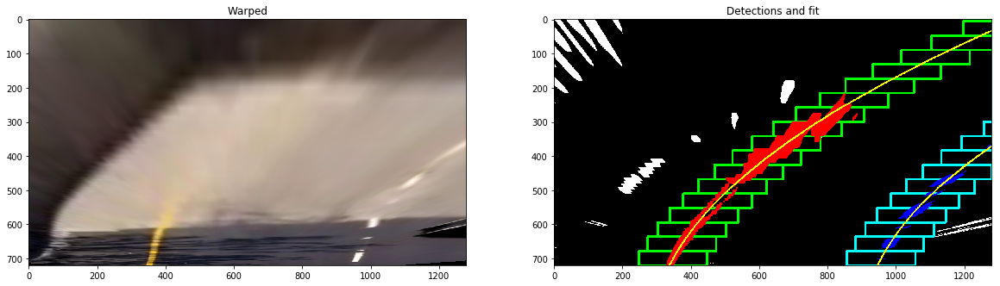

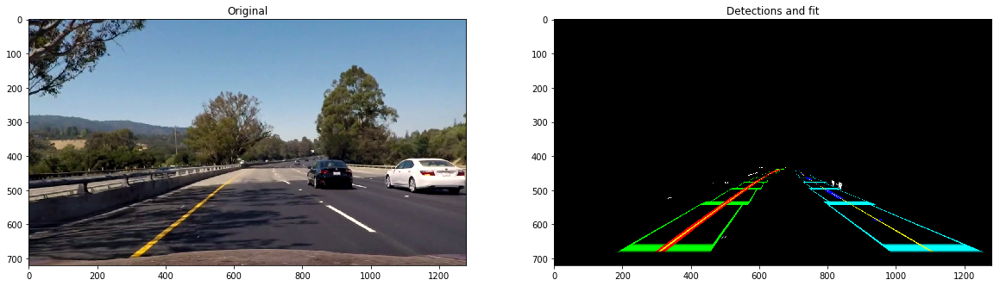

In [49]:
#vertical: 50 pixels is 1 dash line is 3 m
#horizontal: distance between left and right lane in the transformation defined to be 600 = 3.7m

def fit_curve(img,x,y,plot=False,yscale=3./50.,xscale=3.7/600.):
    # Fit a second order polynomial to each. Use the y value also as weight, so that closer by is more important
    w=y
    y=y*yscale
    x=x*xscale
    
    fit = np.polyfit(y, x, 2,w=w)
    
    if (plot):
        # Generate x and y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
        yfit=ploty*yscale
                            
        xfit = (fit[0]*yfit**2 + fit[1]*yfit + fit[2])

        plt.subplots(1,1,figsize=(10, 10))
        plt.imshow(img)
        plt.plot(xfit/xscale, yfit/yscale, color='yellow')

        plt.xlim(0, img.shape[1])
        plt.ylim(img.shape[0], 0)
        plt.show()
        
    return fit

def overlay_fit(img,fit,xscale,yscale,color=(255,255,0),width=3):
    out=np.array(img, copy=True)  
        #only use lower 65%
    offset=int(img.shape[0]*0.35)
    offset=0
    size=img.shape[0]-offset
    #20 points is enough. for as many points as pixels, use size as last parameter
    ploty = np.linspace(offset, offset+size-1, 20 )
    y=ploty*yscale
                            
    fitx = (fit[0]*y**2 + fit[1]*y + fit[2])/xscale

    data=list(zip(fitx, ploty))
    pts=np.asarray(data,np.int32).reshape((-1,1,2))
    cv2.polylines(out,[pts],False,color,width)
    return out
    
    
yscale=1.
xscale=1.
left_fit=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
right_fit=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)

(detections,leftx,lefty,rightx,righty)=detect_lines(binary_warped,redo_margin=100,left_fit=left_fit,right_fit=right_fit,plot=False)



yscale=3./50.
xscale=3.7/600.
left_fit=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
right_fit=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)

fitted=overlay_fit(detections,left_fit,xscale,yscale)
fitted=overlay_fit(fitted,right_fit,xscale,yscale)
plot2(warp(img,M),fitted,'Warped','Detections and fit',True,False)
plot2(img,warp(fitted,Minv),'Original','Detections and fit',True,False)







In [10]:
def curve_and_center(left_fit,right_fit,y,width): 
    left_curverad = ((1 + (2*left_fit[0]*y + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

    xl = left_fit[0]*y**2 + left_fit[1]*y + left_fit[2]
    xr = right_fit[0]*y**2 + right_fit[1]*y + right_fit[2]

    xcenter=(xl+xr)/2
    offcenter=xcenter-width/2
    
    return left_curverad,right_curverad,offcenter,xl,xr



yscale=1.
xscale=1.
left_fit=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
right_fit=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)

yeval=(binary_warped.shape[0]-1)*yscale
width=binary_warped.shape[1]*xscale
(left_curve,right_curve,offcenter,xl,xr)=curve_and_center(left_fit,right_fit,yeval,width)
print('Curvatures 1/pix: ', left_curve, right_curve)
print('Off center pix  : ',offcenter)




yscale=3./50.
xscale=3.7/600.
left_fit=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
right_fit=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)

yeval=(binary_warped.shape[0]-1)*yscale
width=binary_warped.shape[1]*xscale

(left_curve,right_curve,offcenter,xl,xr)=curve_and_center(left_fit,right_fit,yeval,width)
print('Curvatures 1/m: ', left_curve, right_curve)
print('Off center m  : ',offcenter)

Curvatures 1/pix:  563.204041211 481.673862993
Off center pix  :  1.38288189898
Curvatures 1/m:  233.136260698 208.96535544
Off center m  :  0.00852777171043


## Warp back to original image

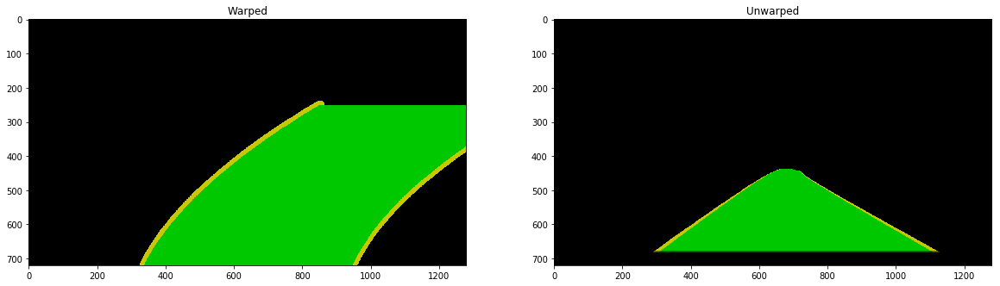

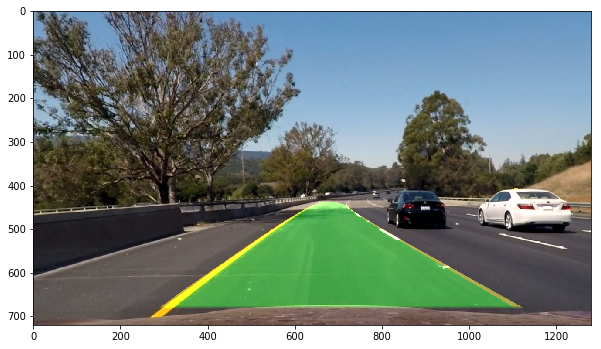

In [11]:
import time


def warp_back(img,left_fit,right_fit,xscale=1.,yscale=1.,plot=False):
    
    out_img=np.zeros_like(img)         
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*0
##    pic = Image.fromarray(out_img)
##    draw=ImageDraw.Draw(pic)

    #only use lower 65%
    offset=int(img.shape[0]*0.35)
    size=img.shape[0]-offset
    #20 points is enough. for as many points as pixels, use size as last parameter
    ploty = np.linspace(offset, offset+size-1, 20 )
    y=ploty*yscale
                            
    left_fitx = (left_fit[0]*y**2 + left_fit[1]*y + left_fit[2])/xscale
    right_fitx = (right_fit[0]*y**2 + right_fit[1]*y + right_fit[2])/xscale

    datal=list(zip(left_fitx, ploty))
    datar=list(zip(right_fitx, ploty))



    ##################
    pts=np.asarray(datal,np.int32).reshape((-1,1,2))
    cv2.polylines(out_img,[pts],False,(200,200,0),25)

    pts=np.asarray(datar,np.int32).reshape((-1,1,2))
    cv2.polylines(out_img,[pts],False,(200,200,0),25)
    
    pts=np.asarray(datar+list(reversed(datal)),np.int32).reshape((-1,1,2))
    cv2.fillPoly(out_img,[pts],(0,200,0))
    

    unwarped = cv2.warpPerspective(out_img, Minv, (pic.size[0],pic.size[1]), flags=cv2.INTER_LINEAR)
    if (plot):
        plot2(out_img,unwarped,'Warped','Unwarped')

    out_img=cv2.addWeighted(img, 1, unwarped, 0.5, 0.)
    
    if (plot):
        plt.subplots(1,1,figsize=(10, 10))
        plt.imshow(out_img)
        plt.show()
    
    return out_img
    
unwarped=warp_back(img,left_fit,right_fit,xscale,yscale,plot=True)

# Complete pipeline
Input is 1 image
Output is an overlayed image, the left and right lane curverture, and the distance from center

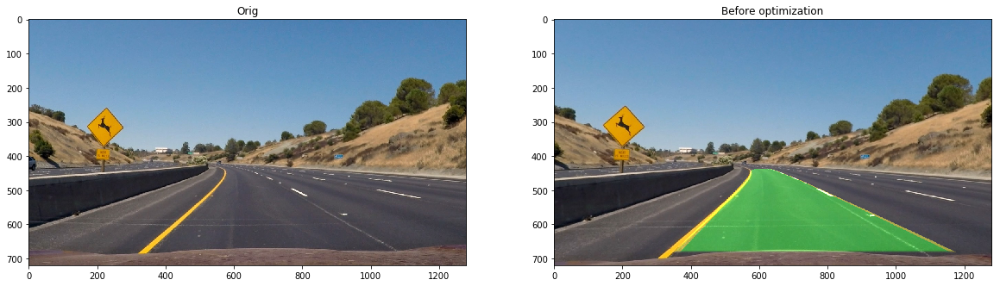

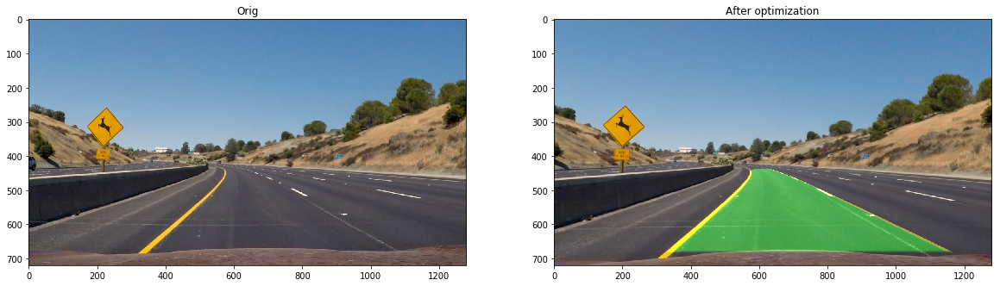

In [30]:
#The pipeline requires global variables to be present for distortion correction, and perspective warp
# and left_fit and right_fit. curvature and offset are stored in global parameters as well

def init_pipeline():
    global left_fit,right_fit, left_curve_values,right_curve_values,offcenter_values,xl_values,xr_values,reset_values
    left_fit=None
    right_fit=None
    left_curve_values=np.array([],np.float32)
    right_curve_values=np.array([],np.float32)
    offcenter_values=np.array([],np.float32)
    xl_values=np.array([],np.float32)
    xr_values=np.array([],np.float32)
    reset_values=np.array([],np.float32)

    
def pipeline(img, distorted=True):
    global left_fit,right_fit, left_curve_values,right_curve_values,offcenter_values,xl_values,xr_values,reset_values
    if(distorted):
        img=undistort(img)
    bin=filter(img)

    bin_warped=warp(bin,M)

    (detections,leftx,lefty,rightx,righty)=detect_lines(bin_warped,plot=False,left_fit=left_fit,right_fit=right_fit)

    yscale=3./50.
    xscale=3.7/600.
    left_fit_cr=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
    right_fit_cr=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)

    yeval=(bin_warped.shape[0]-1)*yscale
    width=bin_warped.shape[1]*xscale

    (left_curve,right_curve,offcenter,xl,xr)=curve_and_center(left_fit_cr,right_fit_cr,yeval,width)


    xscale=1.
    yscale=1.
    left_fit=fit_curve(detections,leftx,lefty,plot=False,yscale=yscale,xscale=xscale)
    right_fit=fit_curve(detections,rightx,righty,plot=False,yscale=yscale,xscale=xscale)
    unwarped=warp_back(img,left_fit,right_fit,xscale,yscale)

    left_curve_values=np.append(left_curve_values,left_curve)
    right_curve_values=np.append(right_curve_values,right_curve)
    offcenter_values=np.append(offcenter_values,offcenter)
    xl_values=np.append(xl_values,xl)
    xr_values=np.append(xr_values,xr)
    #determine whether the values are good. If not, reset and start without fit result next time
    if((offcenter<-1.5)|(offcenter>1.5)|(xl<1)|(xr>7)):
        left_fit=None
        right_fit=None
        reset_values=np.append(reset_values,1.)
    else:
        reset_values=np.append(reset_values,0.)

        
    return unwarped
    

init_pipeline()
img=read_image('test_images/test2.jpg')
unwarped=pipeline(img,True)
plot2(img,unwarped,'Orig','Before optimization')
unwarped=pipeline(img,True)
plot2(img,unwarped,'Orig','After optimization')

## Process all test images with complete pipeline

All images are processed twice: the first time to find the fit lanes, the second time to go through the 
optimized pipeline

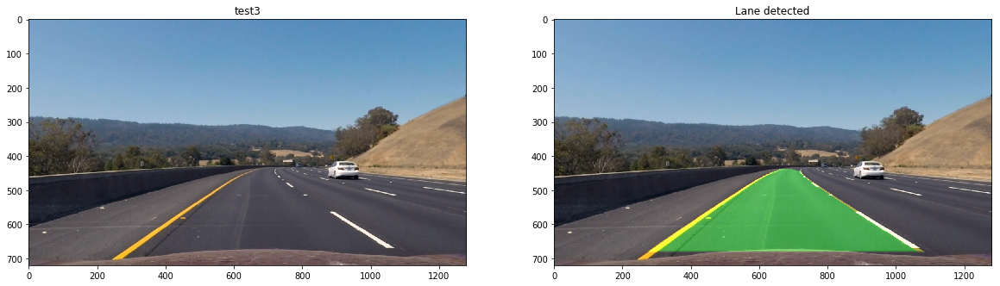

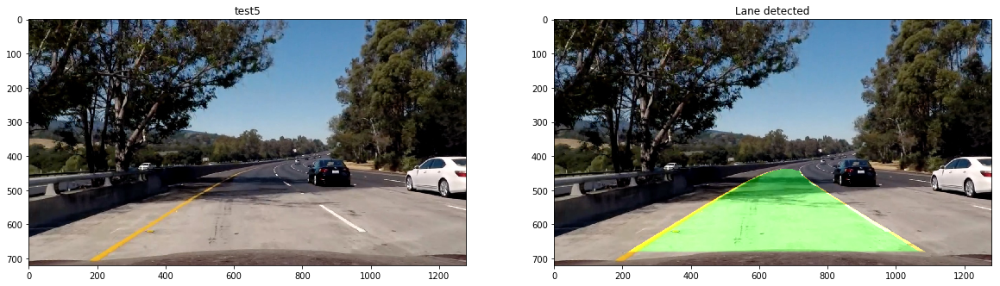

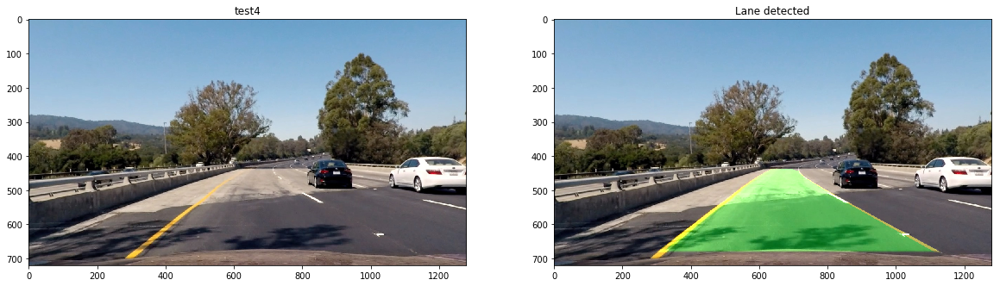

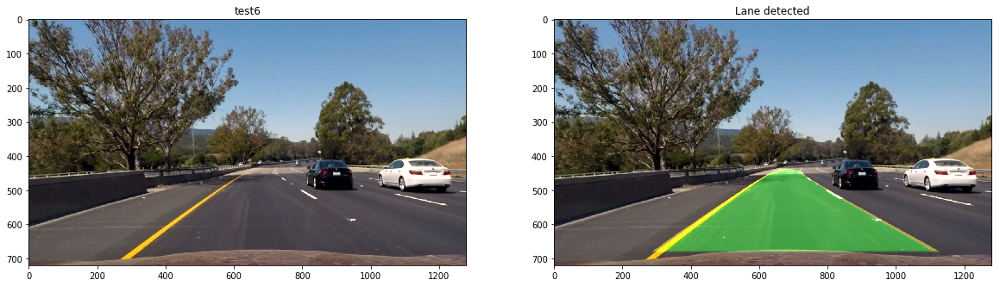

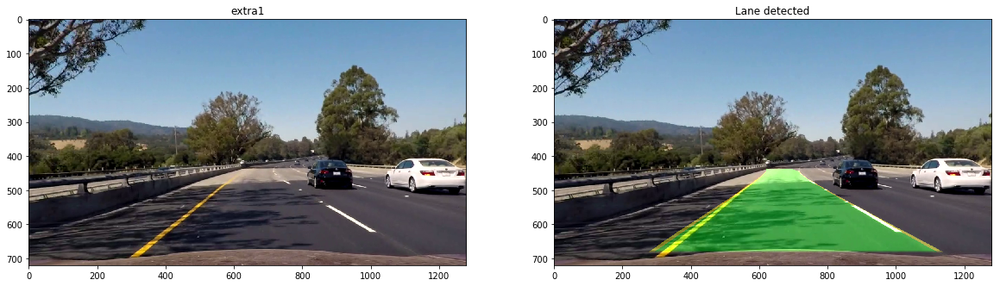

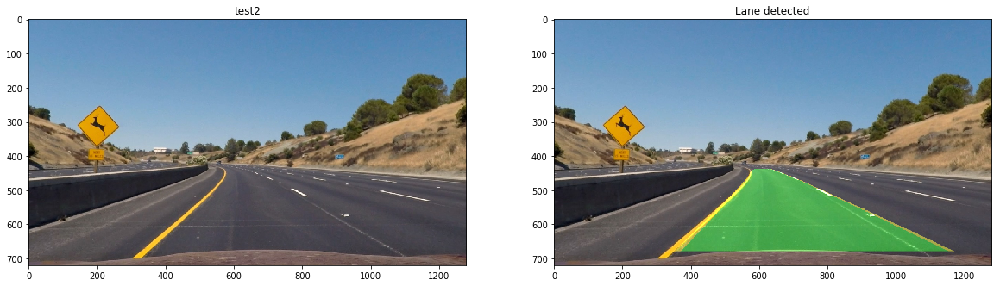

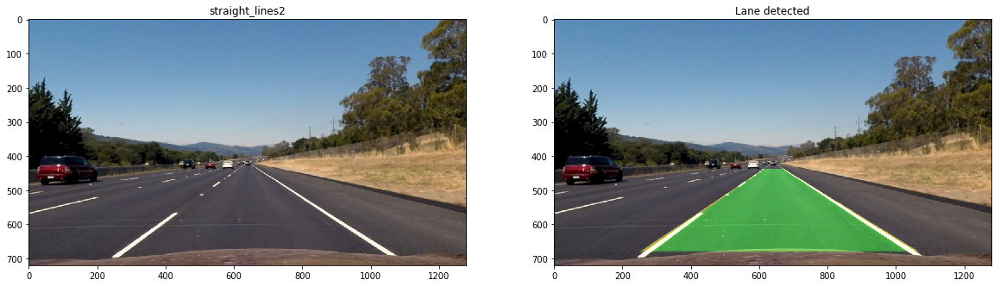

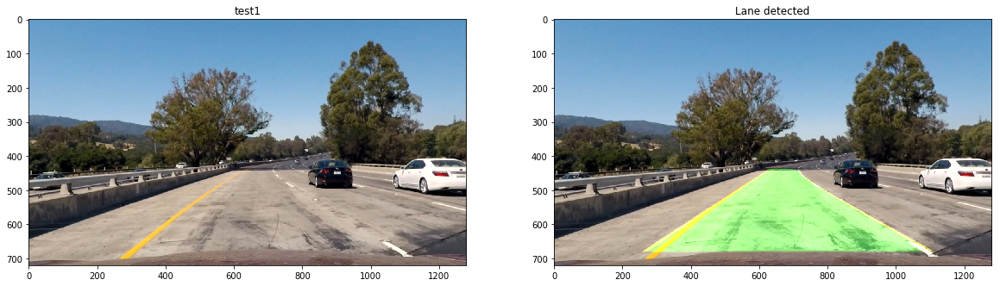

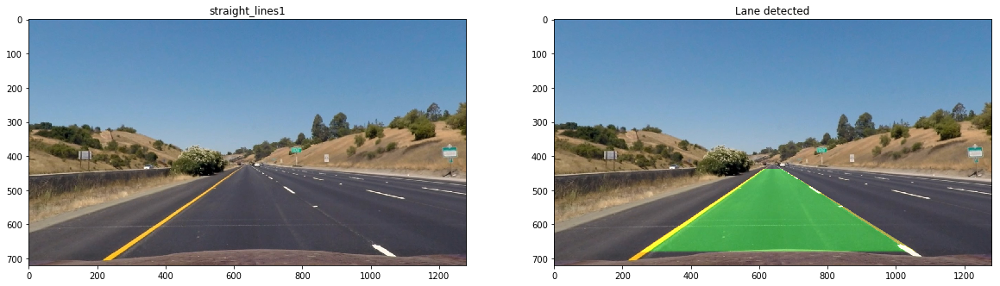

In [13]:
init_pipeline()
for im in test_images:
    img=test_images[im]
    init_pipeline()
    unwarped=pipeline(img,False)
    unwarped=pipeline(img,False)


    plot2(img,unwarped,im,'Lane detected')
    

In [32]:
#plot the curve of position results. Assume 25 frames/sec
def plot_curvatures():
    x=np.linspace(0, (len(left_curve_values))/25, len(left_curve_values) )

    f, ax = plt.subplots(1,2, figsize=(16, 5))
    ax[0].plot(x,left_curve_values)
    ax[0].plot(x,right_curve_values)
    ax[0].set_yscale('log')

    #ax[0].set_ylim([0,5000])
    ax[0].set_title('Radius of Curvature')
    ax[0].set_ylabel('Curvature [m]')
    ax[0].set_xlabel('Time [s]')
    ax[0].grid(True)

    ax[1].plot(x,1./left_curve_values)
    ax[1].plot(x,1./right_curve_values)
    #ax[1].set_ylim([0,5000])
    ax[1].set_title('Radius of Curvature (inv)')
    ax[1].set_ylabel('Curvature [1/m]')
    ax[1].set_xlabel('Time [s]')
    ax[1].grid(True)
    plt.show()
    
    f, ax = plt.subplots(1,2, figsize=(16, 5))
    ax[0].plot(x,offcenter_values)
    ax[0].set_ylim([-1,1])
    ax[0].set_title('Offset from center')
    ax[0].set_ylabel('Offset [m]')
    ax[0].set_xlabel('Time [s]')
    ax[0].grid(True)
    
    ax[1].plot(x,xl_values)
    ax[1].plot(x,xr_values)
#    ax[1].set_ylim([-5,5])
    ax[1].set_title('left and right lane positions')
    ax[1].set_ylabel('Position [m]')
    ax[1].set_xlabel('Time [s]')
    ax[1].grid(True)
    
    f, ax = plt.subplots(1,2, figsize=(16, 5))
    ax[0].plot(x,reset_values)
#    ax[0].set_ylim([-5,5])
    ax[0].set_title('Resets')
    ax[0].set_ylabel('Reset')
    ax[0].set_xlabel('Time [s]')
    ax[0].grid(True)
    plt.show()

## Process the project video

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [02:33<00:00,  7.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



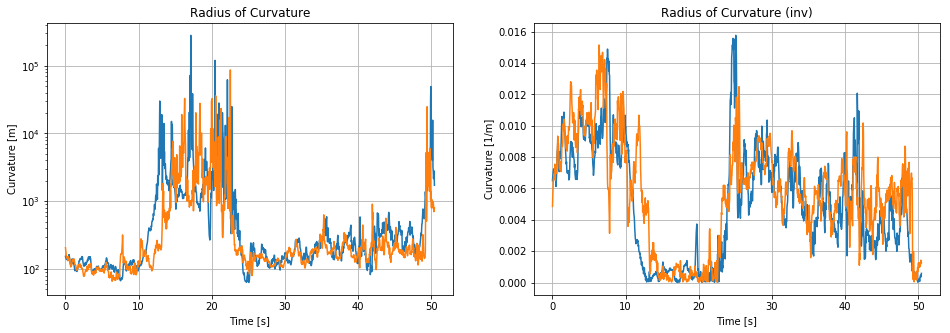

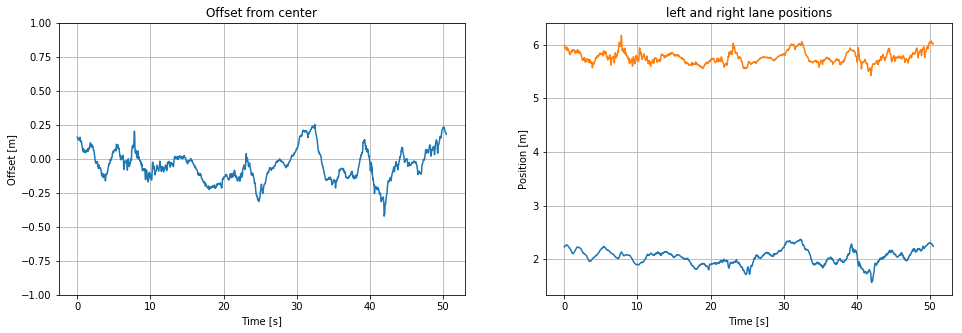

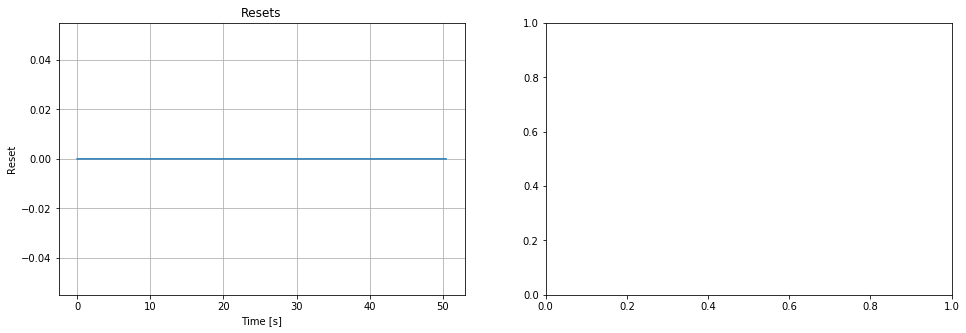

In [33]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip

init_pipeline()
left_curve_values=np.array([],np.float32)
right_curve_values=np.array([],np.float32)
offcenter_values=np.array([],np.float32)

clip1 = VideoFileClip('project_video.mp4')
out = clip1.fl_image(pipeline)
out.write_videofile('result.mp4', audio=False)
plot_curvatures()



## Process the challenge videos

[MoviePy] >>>> Building video challenge_result.mp4
[MoviePy] Writing video challenge_result.mp4


100%|██████████| 300/300 [00:38<00:00,  7.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_result.mp4 



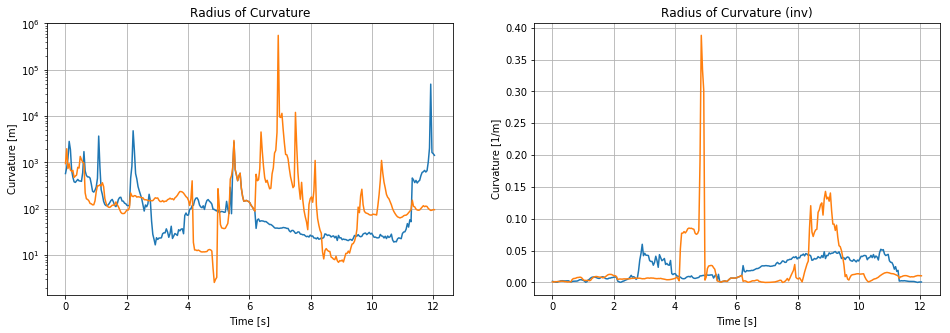

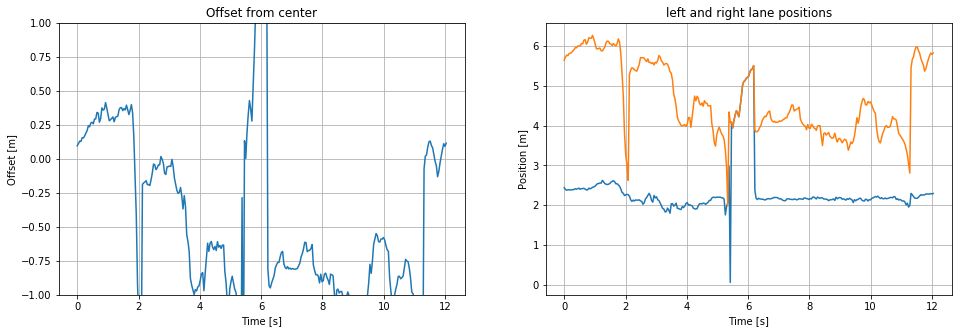

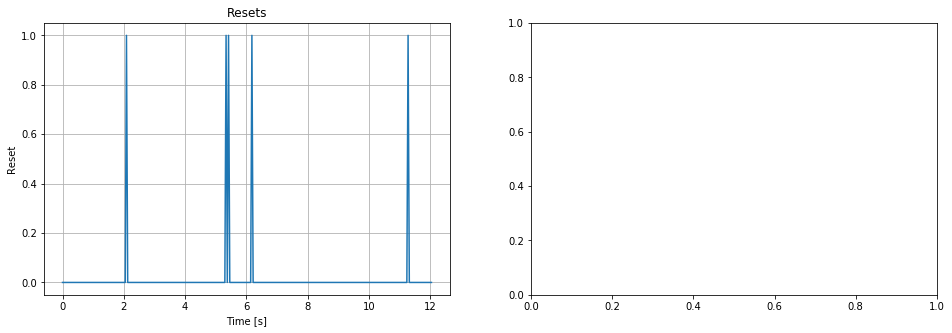

[MoviePy] >>>> Building video harder_challenge_result.mp4
[MoviePy] Writing video harder_challenge_result.mp4


100%|█████████▉| 250/251 [00:38<00:00,  5.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_result.mp4 



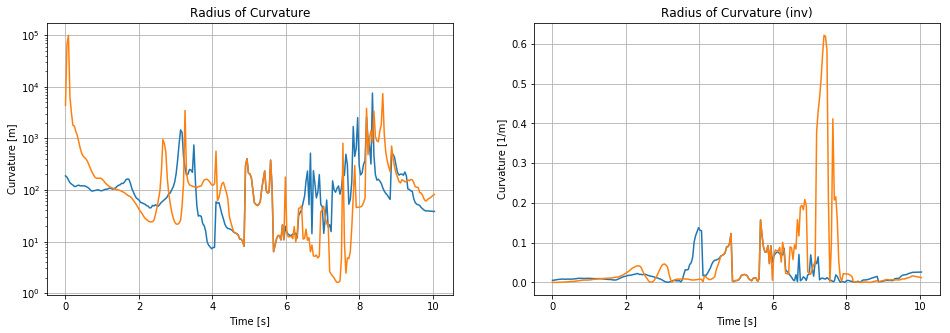

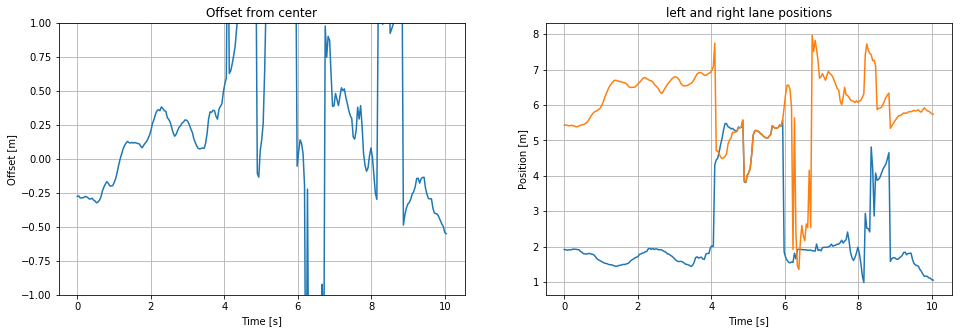

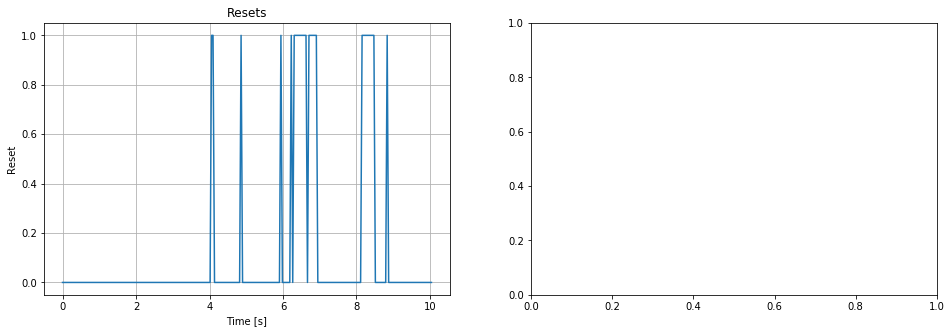

In [35]:
init_pipeline()

clip1 = VideoFileClip('challenge_video.mp4').subclip(0,10)
out = clip1.fl_image(pipeline)
out.write_videofile('challenge_result.mp4', audio=False)

plot_curvatures()

init_pipeline()
clip1 = VideoFileClip('harder_challenge_video.mp4').subclip(0,10)
out = clip1.fl_image(pipeline)
out.write_videofile('harder_challenge_result.mp4', audio=False)

plot_curvatures()

# Writeup

# Advanced lane finding
**Author: Igor Passchier**

**igor.passchier@tassinternational.com**

## Introduction

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Provided results
The following documents are provided as part of this project report:
* **Writeup**: This document
* **Example images**: Can be found in the [output](output) subdirectory
* **Result video**: Can also be found in the [output](output) subdirectory
* **Code**: The code is stored in the jupyter notebook [CarND-Advanced-Lanes.ipynb](CarND-Advanced-Lanes.ipynb). The structure of the notebook is in line with the Rubric points, and this writeup. Code blocks will be referred based on sections in the notebook

[//]: # (Image References)

[calibration1]: ./output/calibration1.png "Calibration 1"
[calibration2]: ./output/calibration2.png "Calibration 2"

[filtergray]: ./output/filtergray.png "Gray filter"
[filterr]: ./output/filterr.png "Red filter"
[filterl]: ./output/filterl.png "Lightness filter"
[filtersobel]: ./output/filtersobel.png "Sobel x filter"
[filterfinal]: ./output/filterfinal.png "Final filter"

[perspective1]: ./output/perspective1.png "Perspective tranform"
[perspective2]: ./output/perspective2.png "Perspective tranform"




[image2]: ./test_images/test1.jpg "Road Transformed"
[image3]: ./examples/binary_combo_example.jpg "Binary Example"
[image4]: ./examples/warped_straight_lines.jpg "Warp Example"
[image5]: ./examples/color_fit_lines.jpg "Fit Visual"
[image6]: ./examples/example_output.jpg "Output"
[video1]: ./project_video.mp4 "Video"

## [Rubric](https://review.udacity.com/#!/rubrics/571/view) Points


### Writeup / README

#### 1. Provide a Writeup / README that includes all the rubric points and how you addressed each one.  You can submit your writeup as markdown or pdf.  [Here](https://github.com/udacity/CarND-Advanced-Lane-Lines/blob/master/writeup_template.md) is a template writeup for this project you can use as a guide and a starting point.  

Its this document.

### Camera Calibration

#### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

The camera calibration is implemented in the 2 code blocks in the *Compute the camera calibration matrix and 
distortion coefficients* section. The first section is to get a feeling on how 
<code>cv2.findChessboardCorners</code> is working. In the second section, all calibration images are processed to 
determine all chessboard corners. The actual camera calibration is done with <code>cv2.calibrateCamera</code>.
The results are stored in a global variable with the calibration matrix. Below one of the calibration
images before and after distortion correction is shown. 

![Calibration 1][calibration1]

** Figure 1: Calibration image before and after distortion correction **

### Pipeline (single images)

#### 1. Provide an example of a distortion-corrected image.

The correction calculated in the previous step, is applied to one of the test images.

![Calibration 2][calibration2]

** Figure 2: Test image before and after distortion correction **

#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

I have implemented an extensive set of filters, and tuned them all to detect the lane pixels as good as possible. 
The code is provided in the code block in the *Create a threshold binary image* section. For the tuning, I have 
also created an additional test image. This image is selected to have different shades of concrete, and also 
shadows of the trees. This extra image is shown later, together with the final filter.

The filters I have tuned, operate on the following layers:
* Red, Green, and Blue
* Gray
* Hue, Saturation, Lightness
* Sobel x, Sobel y, Sobel absolute, Sobel gradient

For these 4 sets of filters, a optimized combinations per set, to get the best result. Per filter per set, I 
optimized to make sure not to lose too many valid pixels, to the expense of have more invalid pixels selected. 
I ended up using the following filters per set:
* rgb: only a filter on red
* gray: kept as is
* hsl: An <code>and</code> of (wide) filters on h, s, and l
* sobel: only sobel x is kept

![Red Filter][filterr]

** Figure 3: Red filter **

![Gray Filter][filtergray]

** Figure 4: Gray filter **

![Lightness Filter][filterl]

** Figure 5: Lightness filter **

![Sobel x Filter][filtersobel]

** Figure 6: Sobel x filter **

As a second step, I combine these 4 resulting filters, where I take an <code>and</code> of rgb, gray, and hsl, 
and then an <code>or</code> with sobel. The first 3 filters all select the actual lane pixels directly, so taking 
an <code>and</code> requires the pixels to be identified as a lane pixel 3 times. The sobel filter actually 
filters the edges, and not the lane pixels itself. Therefore, if I would include this in the <code>and</code>, 
that would throw away a lot of the pixels of the lanes. By taking an <or>, I combine the dtection of the actual 
pixels, with the detection of the border of the lanes: Best of both worlds. Or, in code:

```python
    filter=((greybin>0) & (rgbbin>0) & (hslbin>0)) | (sobelbin>0)
```

![Final combined filter][filterfinal]

** Figure 6: Final, combined filter **

In a later stage, to speed up the calculation, I have commented out all the filters that are not actually used. 
These lines have been commented out by 2 hashes (##)

The final filter is implemented in the function <code>filter</code>, starting at line 39.

#### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

The perspective transform is implemented in the section *Birds-eye view*. I have implemented 2 function. The first, starting at line 3, calculates the tranformation matrix and the inverse transformation matrix. I have used straitght_lines1.jpg image for the calibration. In this image, I have select 4 points on the lanes for the transformation: 
```
    [266,675],[1038,675],[655,433],[619,433]
```
and tranformed that to a destination rectangle, defined by
```
    [300,719]-[900,10]
```

The actual perspective transform is implemented in the function <code>warp</code>, starting at line 32. Below
are 2 examples of transformed images. The first is the image used to determine the perspective transform, 
including overlayed green lines indicating the area used for the transformation, and a binary picture of straight 
lines.

![Perspective transform][perspective1]

** Figure 7: Result of the perspective transform. The green line specifies the area used to determine the transform. **

![Perspective transform][perspective2]

** Figure 8: Straight line binary image perspective transform result. **

#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

The code to detect the lane lines is provided in the section *Detect lane pixels and fit to find the lane 
boundary*. I have implemented 2 helper function, to calculate sliding window boxes (within limits of the shape), 
at line 1. The second helper function is to extract all relevant pixels within a window, starting at line 14. The 
actual algoritm is implemented in <code>detect_lines</code>, starting at line 25.

The rationale of the algoritm is as follows;
1. Initially, no line fits are available, and a histgram is made of the lower 1/3 of the image. The peaks on left and right half are used as starting point. Only 1/3 is used, because that gives better results than with 1/2, if the lanes are curved.
2. Then, 17 windows from bottom to top are created. The center is taken to be the average pixels of the previous window with sufficient pixels.
3. As an optimization, if sufficent pixels are found, the process is repeated with a smaller window, around the average of the points in the current window (in contrast, in step 2 the average of the previous window is used). This allows to use a smaller window, even when the lanes are stongly curved.
4. If a valid fit is already available from a previous step, then step 1, 2 and 3 are replaced by selecting the window based on the result of the fit of the previous step. In this case, the smaller window size is used, similar as in step 3.




#### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

I did this in lines # through # in my code in `my_other_file.py`

#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

I implemented this step in lines # through # in my code in `yet_another_file.py` in the function `map_lane()`.  Here is an example of my result on a test image:

![alt text][image6]

---

### Pipeline (video)

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

Here's a [link to my video result](./project_video.mp4)

---

### Discussion

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

Here I'll talk about the approach I took, what techniques I used, what worked and why, where the pipeline might fail and how I might improve it if I were going to pursue this project further.   
